In [1]:
import time
import cv2
import numpy as np
import tensorflow as tf

from yolov3_tf2.models import YoloV3
from yolov3_tf2.dataset import transform_images, load_tfrecord_dataset
from yolov3_tf2.utils import draw_outputs
from absl import app, logging, flags
from absl.flags import FLAGS

from keras.preprocessing import image
import matplotlib.pyplot as plt
from IPython.display import Image, display

In [2]:
flags.DEFINE_string('classes', 'C:\Windows\System32\yolov3-tf2\data\coco.names', 'classes file')
flags.DEFINE_string('weights', 'C:\Windows\System32\yolov3-tf2\checkpoints\yolov3.tf', 'weights file')
flags.DEFINE_boolean('tiny', False, 'yolov3 or yolov3-tiny')
flags.DEFINE_integer('size', 416, 'resize images to')
flags.DEFINE_string('image', 'C:\Windows\System32\yolov3-tf2\data\girl.png', 'input image')
flags.DEFINE_string('tfrecord', None, 'tfrecord')
flags.DEFINE_string('output', 'C:\Windows\System32\yolov3-tf2\output.jpg', 'output image')
flags.DEFINE_integer('num_classes', 80, 'number of classes')

app._run_init(['yolov3'], app.parse_flags_with_usage)

physical_devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [3]:
yolo = YoloV3(classes = FLAGS.num_classes)
yolo.load_weights(FLAGS.weights).expect_partial()
class_names = [c.strip() for c in open(FLAGS.classes).readlines()]

Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.


W0204 13:18:08.276043 17804 deprecation.py:534] From C:\Users\bit\Anaconda3\envs\yolov3-tf2-gpu\lib\site-packages\tensorflow\python\ops\array_ops.py:5049: calling gather (from tensorflow.python.ops.array_ops) with validate_indices is deprecated and will be removed in a future version.
Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.


In [4]:
def detector():
    img_raw = tf.image.decode_image(open(FLAGS.image,'rb').read(), channels=3)
    
    img = tf.expand_dims(img_raw, 0)
    img = transform_images(img, FLAGS.size)
    
    t1 = time.time()
    boxes, scores, classes, nums = yolo(img)
    t2 = time.time()
    print('time: {}'.format(t2-t1))
    
    for i in range(nums[0]):
        print('{}, {}, {}'.format(class_names[int(classes[0][i])],
                                  np.array(scores[0][i]),
                                  np.array(boxes[0][i])))
        
    img = cv2.cvtColor(img_raw.numpy(), cv2.COLOR_RGB2BGR)
    img = draw_outputs(img, (boxes, scores, classes, nums), class_names)
    
    return img
    

In [ ]:
!ls data

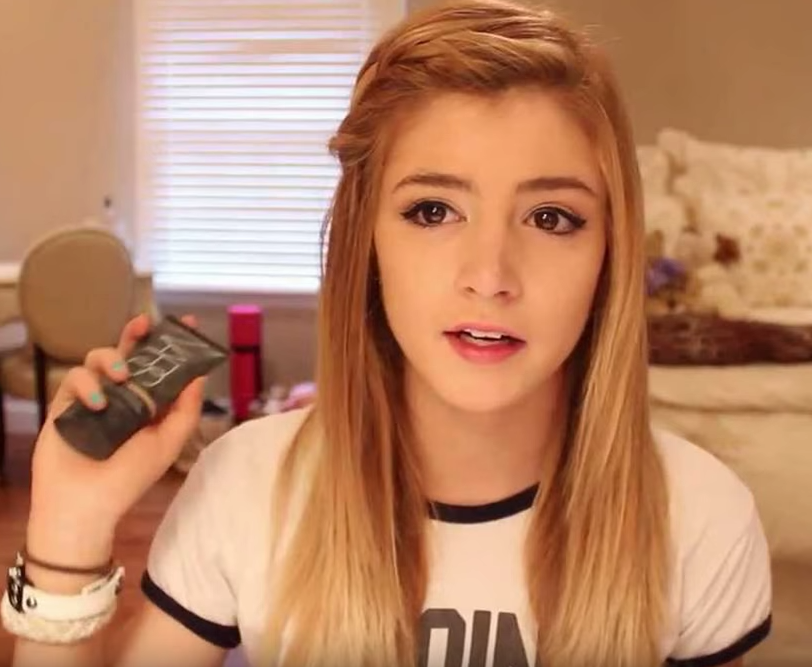

In [5]:
FLAGS.image = 'C:\Windows\System32\yolov3-tf2\data\girl.png'
Image(filename = FLAGS.image, width = 500)

time: 2.4597015380859375
person, 0.9997697472572327, [0.06754464 0.03718692 0.9679881  0.9650753 ]
chair, 0.9255483150482178, [0.01851872 0.34200275 0.17385136 0.62783295]


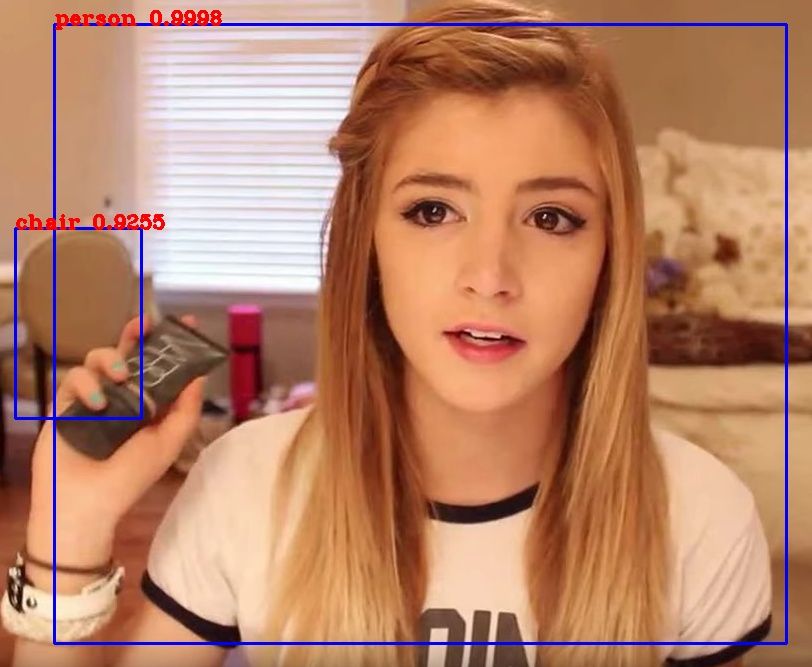

In [6]:
output = detector()
display(Image(data = bytes(cv2.imencode('.jpg', output)[1]), width=500))

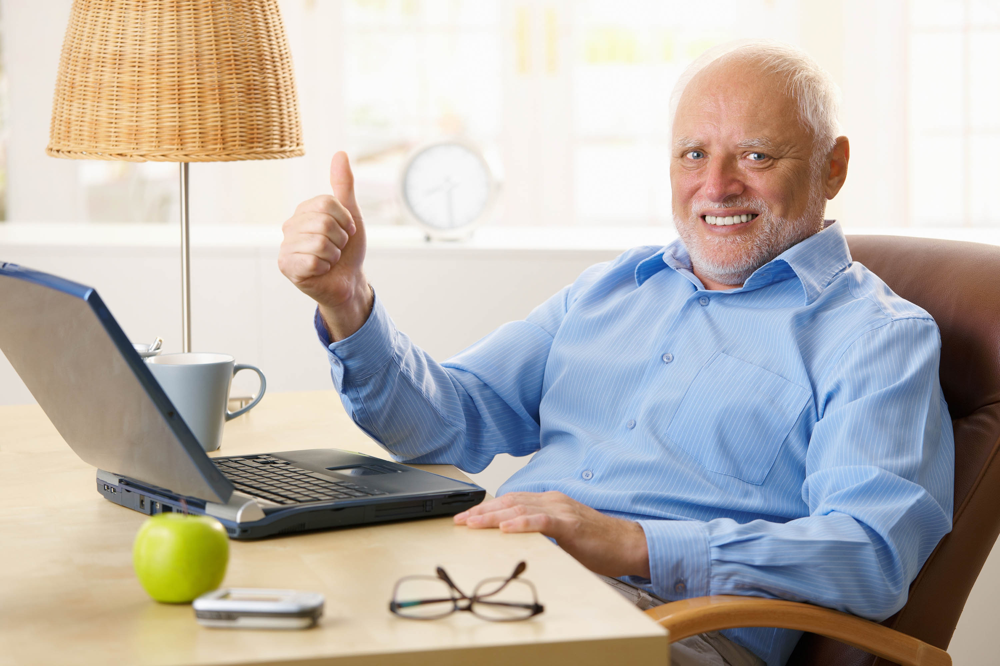

In [7]:
FLAGS.image = 'C:\Windows\System32\yolov3-tf2\data\meme.jpg'
Image(filename = FLAGS.image, width = 500)

time: 0.21101713180541992
cup, 0.9980731010437012, [0.14266218 0.52777606 0.27184254 0.65748256]
person, 0.9976975321769714, [0.2898291  0.0985465  0.95846486 0.9202168 ]
laptop, 0.9599869847297668, [-0.01710647  0.3949369   0.52297276  0.7962775 ]
apple, 0.9081627726554871, [0.13114461 0.77143586 0.22893354 0.90729535]
cell phone, 0.7321373224258423, [0.18850097 0.87569416 0.3350185  0.9422209 ]
clock, 0.6700006127357483, [0.4010809  0.21244612 0.49267417 0.35021505]
cup, 0.5366387367248535, [0.15088229 0.52855617 0.25541586 0.66439587]
chair, 0.5001125335693359, [0.2950731 0.3067719 0.9998861 0.9955944]


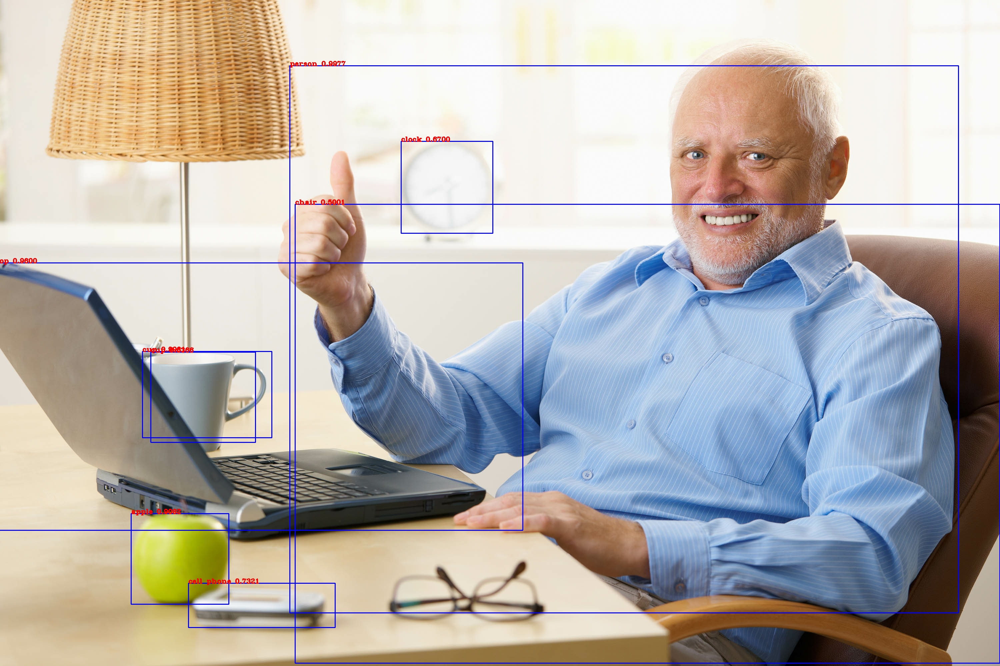

In [8]:
output = detector()
display(Image(data = bytes(cv2.imencode('.jpg', output)[1]), width=500))

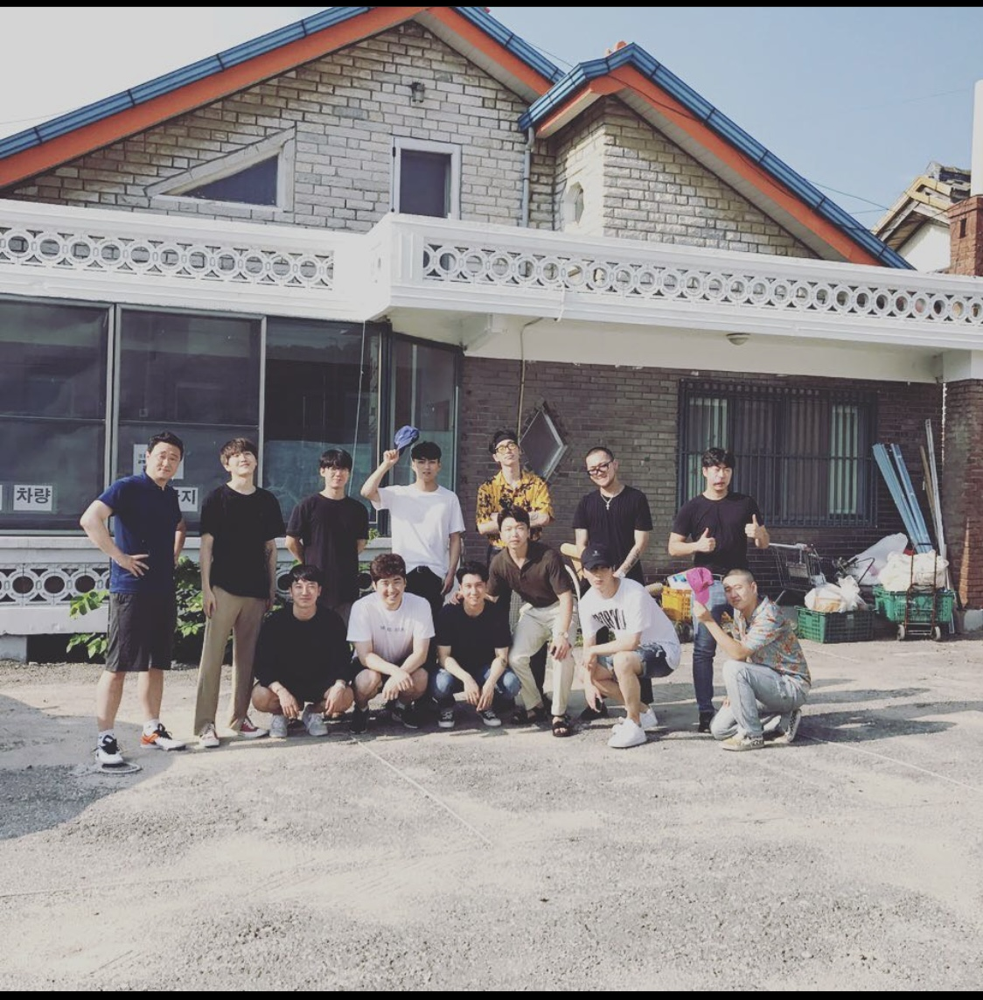

In [11]:
FLAGS.image = 'C:\\Windows\\System32\\yolov3-tf2\\data\\boys.jpg'
Image(filename = FLAGS.image, width = 500)

time: 0.36815762519836426
person, 0.9974213242530823, [0.07832318 0.4333921  0.19203025 0.75805587]
person, 0.994152843952179, [0.18858726 0.44107574 0.29802188 0.7384123 ]
person, 0.9908893704414368, [0.5728713  0.44696075 0.6682334  0.6039838 ]
person, 0.9857112169265747, [0.37767342 0.43980068 0.4783757  0.61599463]
person, 0.9702739715576172, [0.47936448 0.43030468 0.5693452  0.5935174 ]
person, 0.9646064639091492, [0.34418514 0.552404   0.44876274 0.7297978 ]
person, 0.9431061744689941, [0.7137996  0.5720265  0.83628166 0.7513926 ]
person, 0.939210057258606, [0.28882706 0.4414454  0.387807   0.6238052 ]
person, 0.932350754737854, [0.43275198 0.5601622  0.52922153 0.73083293]
person, 0.8962472081184387, [0.49019876 0.51865524 0.59959346 0.7392184 ]
person, 0.8611559271812439, [0.66691995 0.44234556 0.77842677 0.6847504 ]
person, 0.8259837031364441, [0.24630228 0.56047285 0.37969908 0.7363405 ]
person, 0.8025530576705933, [0.5810497 0.5465425 0.6776023 0.7497003]
person, 0.523512601

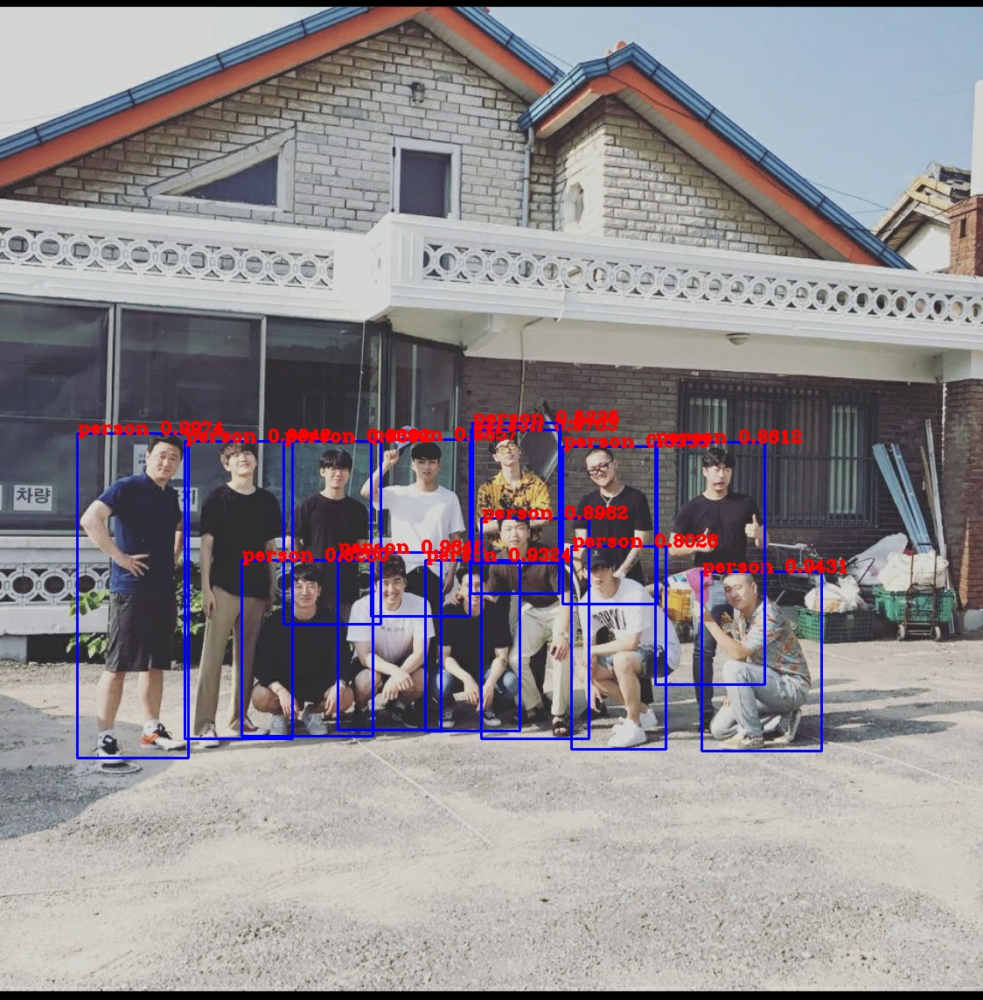

In [13]:
output = detector()
display(Image(data = bytes(cv2.imencode('.jpg', output)[1]), width=300))

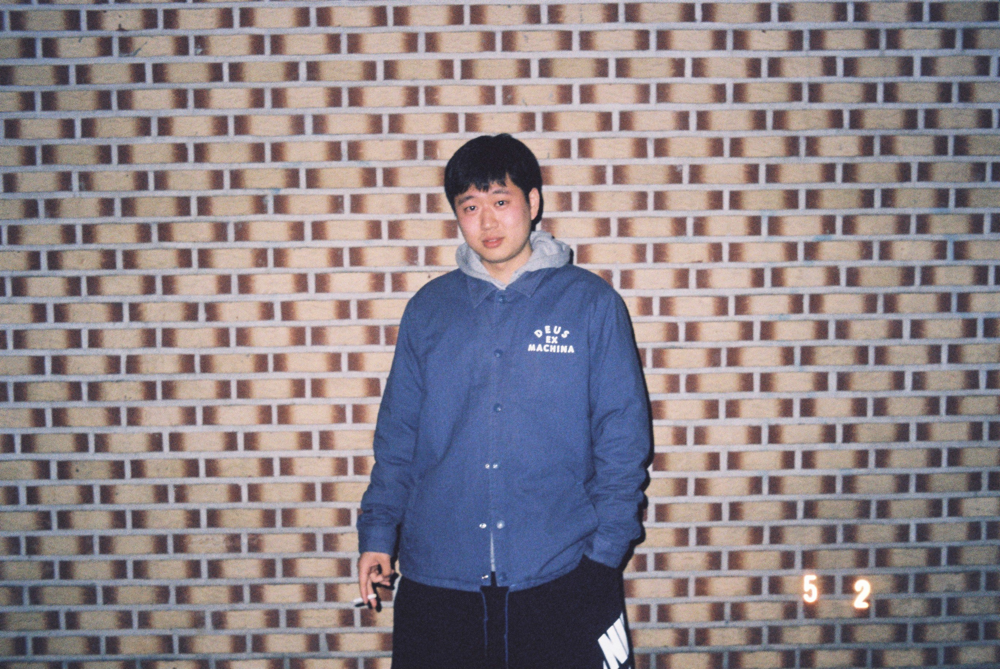

In [17]:
FLAGS.image = 'C:\\Windows\\System32\\yolov3-tf2\\data\\boy.jpg'
Image(filename = FLAGS.image, width = 50)

time: 0.27322816848754883
person, 0.995496392250061, [0.35366166 0.17457503 0.6633018  1.0024736 ]


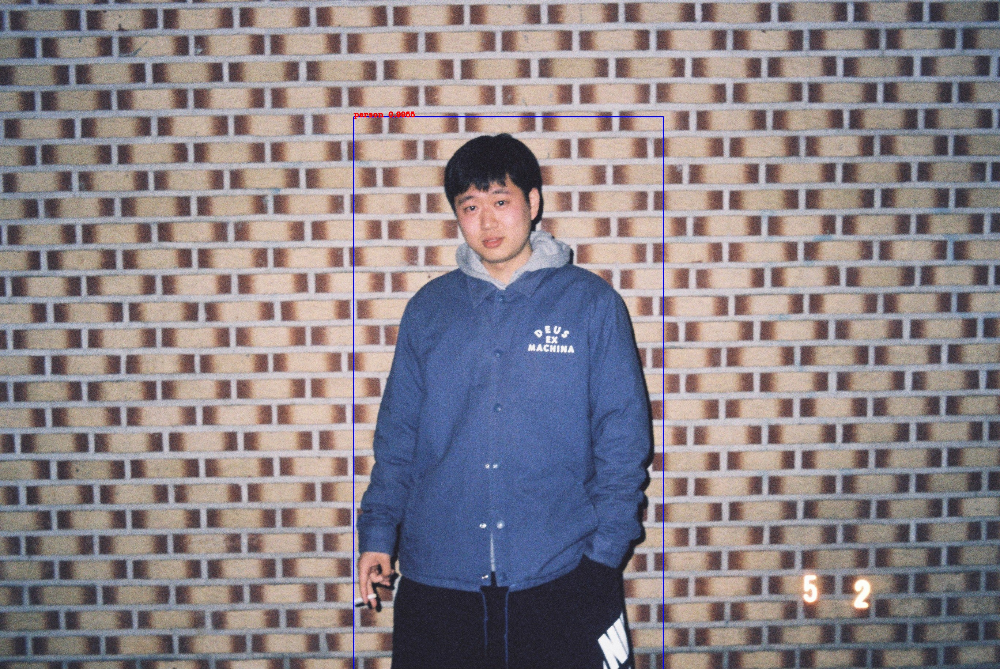

In [18]:
output = detector()
display(Image(data = bytes(cv2.imencode('.jpg', output)[1]), width=50))